<a href="https://colab.research.google.com/github/Amna-svg-lang/LGTA/blob/main/L_GTA(BASE_IMPROVEMENT(LCR)).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install scikit-optimize


In [2]:
import torch
print(f"PyTorch version: {torch.version}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA device: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'None'}")

PyTorch version: <module 'torch.version' from '/usr/local/lib/python3.12/dist-packages/torch/version.py'>
CUDA available: True
CUDA device: Tesla T4


To use the code in Google Colab, first clone the repo and change directory:

python

In [3]:
!git clone https://github.com/luisroque/latent-generative-modeling-time-series-augmentation.git
%cd latent-generative-modeling-time-series-augmentation/lgta


Cloning into 'latent-generative-modeling-time-series-augmentation'...
remote: Enumerating objects: 252, done.
remote: Counting objects: 100% (252/252), done.
remote: Compressing objects: 100% (183/183), done.
remote: Total 252 (delta 121), reused 191 (delta 64), pack-reused 0 (from 0)
Receiving objects: 100% (252/252), 3.48 MiB | 9.12 MiB/s, done.
Resolving deltas: 100% (121/121), done.
/content/latent-generative-modeling-time-series-augmentation/lgta


In [3]:
%cd /content/latent-generative-modeling-time-series-augmentation
import sys
sys.path.append('.')


/content/latent-generative-modeling-time-series-augmentation


STEP 2: Install Requirements
If a requirements.txt exists in the root folder, install it:

In [4]:
!pip install torch numpy pandas matplotlib scikit-learn seaborn tqdm




In [5]:
!pip install fastdtw


In [6]:
!pip install dtw-python


In [7]:
%cd /content/latent-generative-modeling-time-series-augmentation
import sys
sys.path.append('.')


/content/latent-generative-modeling-time-series-augmentation


In [8]:
import os
print(os.listdir())           # Should list: ['lgta', 'README.md', ...]
print(os.listdir('lgta'))     # Should list: ['model', 'feature_engineering', ...]
print(os.listdir('lgta/model'))  # Should list many .py files including 'create_dataset_versions_vae.py'


['lgta', 'data', 'assets', '.gitignore', '.git', 'LICENSE', 'README.md']
['e2e', 'feature_engineering', '__init__.py', '__pycache__', 'preprocessing', 'transformations', 'model', 'experiments', 'benchmarks', 'assets', 'visualization', 'utils', 'tests', 'evaluation', 'postprocessing']
['generate_data.py', '__init__.py', '__pycache__', 'helper.py', 'create_dataset_versions_vae.py', 'hyperparameter_tuning.py', 'models.py', '.ipynb_checkpoints']


In [9]:
!pip install dtaidistance


In [10]:
from lgta.model.create_dataset_versions_vae import CreateTransformedVersionsCVAE


This cell imports all the required modules for:

plotting (matplotlib, numpy)

building and using the L-GTA CVAE model (CreateTransformedVersionsCVAE)

generating augmented datasets (generate_datasets)

visualizing series and transformations

evaluating residuals and metrics

end-to-end (e2e) comparison utilities

These functions together implement the full L-GTA workflow: train model → generate data → apply transformations → compare with benchmarks → analyze metrics.

In [11]:
import matplotlib.pyplot as plt
import numpy as np
from lgta.model.create_dataset_versions_vae import (
    CreateTransformedVersionsCVAE,
)
from lgta.feature_engineering.feature_transformations import detemporalize
from lgta.visualization.comparison_analysis import (
    plot_transformations_with_generate_datasets,
    plot_series_comparisons,
    plot_single_time_series,
)
from lgta.model.generate_data import generate_datasets
from lgta.evaluation.evaluation_comparison import (
    standardize_and_calculate_residuals,
    analyze_transformations,
    plot_residuals_gradient,
)
from lgta.postprocessing.postprocessing_comparison import (
    process_transformations,
    create_prediction_comparison_dataset,
    create_distance_metrics_dataset,
    create_reconstruction_error_percentage_dataset,
)
from lgta.e2e.e2e_processing import e2e_transformation, compare_diff_magnitudes


Cell 2 – Choose dataset and basic settings
Text cell:

This cell selects which dataset and frequency to use.
The script supports three datasets:

Tourism (monthly, M)

M5 (weekly, W)

Police data (daily, D)

top can limit how many series you use (e.g., top = 500 for the largest 500 time series).

For now, the code uses the Tourism dataset with monthly frequency.

In [12]:
dataset = "tourism"
freq = "M"
top = None

# For M5 dataset
# dataset = "m5"
# freq = "W"
# top = 500

# For police dataset
# dataset = "police"
# freq = "D"
# top = 500


Cell 3 – Create and train the CVAE (L-GTA baseline model)
Text cell:

This cell:

Creates a CreateTransformedVersionsCVAE object, which:

Loads the dataset

Preprocesses it

Sets up the L-GTA CVAE model (encoder, decoder, etc.)

Calls fit() to train the model on the chosen dataset.

Calls predict() to:

Reconstruct the original time series (X_hat)

Obtain latent representations (z)

This is the baseline L-GTA training + reconstruction step.

In [14]:
import os
os.makedirs('assets/data/original_datasets', exist_ok=True)


In [15]:
save_path = f"model_weights/tourism_vae.weights.h5"




In [13]:
create_dataset_vae = CreateTransformedVersionsCVAE(
    dataset_name=dataset, freq=freq, top=top, dynamic_feat_trig=False
)
model, _, _ = create_dataset_vae.fit()
X_hat, z, _, _ = create_dataset_vae.predict(model)


/content/latent-generative-modeling-time-series-augmentation/lgta/model/create_dataset_versions_vae.py:119: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.df.asfreq(self.freq)


Model: "cvae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_CVAE (Functional)       │ ((None, 2), (None, 2), │     4,622,902 │
│                                 │ (None, 2))             │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_CVAE (Functional)       │ (None, 10, 304)        │    10,005,856 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,628,758 (55.80 MB)

 Trainable params: 14,628,146 (55.80 MB)

 Non-trainable params: 612 (2.39 KB)

Cell 4 – Visualize original vs reconstructed time series
Text cell:

This cell:

Extracts the raw original training series (X_train_raw)

Plots the first time series of:

X_hat_orig: reconstructed by L-GTA

X_orig: original

This lets you visually check how well the baseline model reconstructs the data.

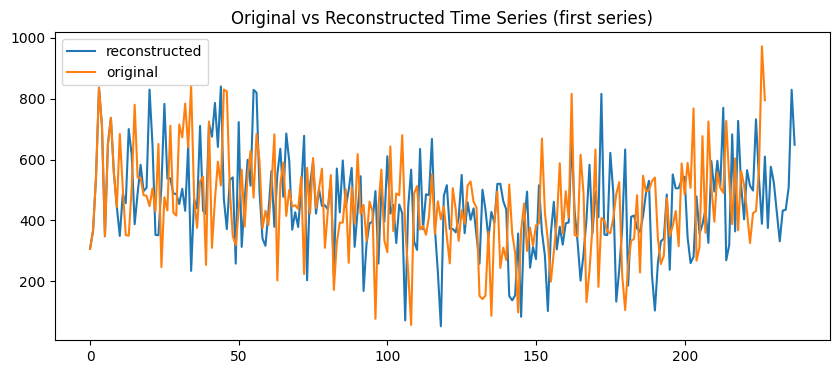

In [14]:
X_orig = create_dataset_vae.X_train_raw
X_hat_orig = X_hat

plt.figure(figsize=(10, 4))
plt.plot(X_hat_orig[:, 0], label="reconstructed")
plt.plot(X_orig[:, 0], label="original")
plt.legend()
plt.title("Original vs Reconstructed Time Series (first series)")
plt.show()


Cell 5 – Define transformation settings for visualization
Text cell:

This cell defines a list of transformations to apply in the latent space for visualization and analysis.

Each dictionary describes:

transformation: type (e.g., "jitter", "magnitude_warp")

params: the parameter(s) for L-GTA’s latent transformation

parameters_benchmark: parameters used by classical/direct augmentation methods for comparison

version: controls which internal version of the transformation is used

These will be used to generate and visualize transformed series, side by side with benchmark methods.

In [15]:
transformations_plot = [
    {
        "transformation": "jitter",
        "params": [0.5, 0.5, 0.5, 0.5],
        "parameters_benchmark": {
            "jitter": 0.5,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 5,
    },
    {
        "transformation": "magnitude_warp",
        "params": [0.1, 0.1, 0.1, 0.1],
        "parameters_benchmark": {
            "jitter": 0.5,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 4,
    },
]


Cell 6 – Plot multiple transformed series (L-GTA vs benchmark)
Text cell:

This cell uses plot_transformations_with_generate_datasets to:

Generate transformed time series using:

L-GTA latent-space transformations

Benchmark direct transformations

Plot several series (num_series=4) to compare:

How L-GTA’s augmented data looks vs.

Classic augmentation (like raw jittering or magnitude warping)

This helps you visually compare semi-synthetic vs directly augmented time series.

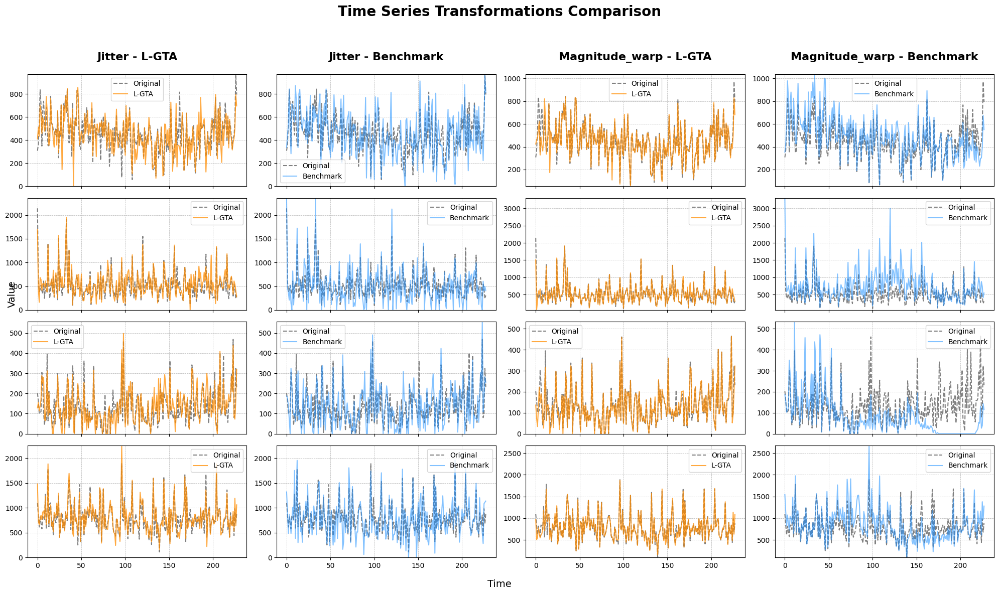

In [16]:
plot_transformations_with_generate_datasets(
    dataset=dataset,
    freq=freq,
    generate_datasets=generate_datasets,
    X_orig=X_orig,
    model=model,
    z=z,
    create_dataset_vae=create_dataset_vae,
    transformations=transformations_plot,
    num_series=4,
)


Cell 7 – Plot single time series under different transformations
Text cell:

This cell uses plot_single_time_series to:

Focus on individual time series

Apply the transformations defined above

Show how a single series changes under:

L-GTA latent transformations

Baseline benchmark transformations

This gives a more detailed, per-series comparison.

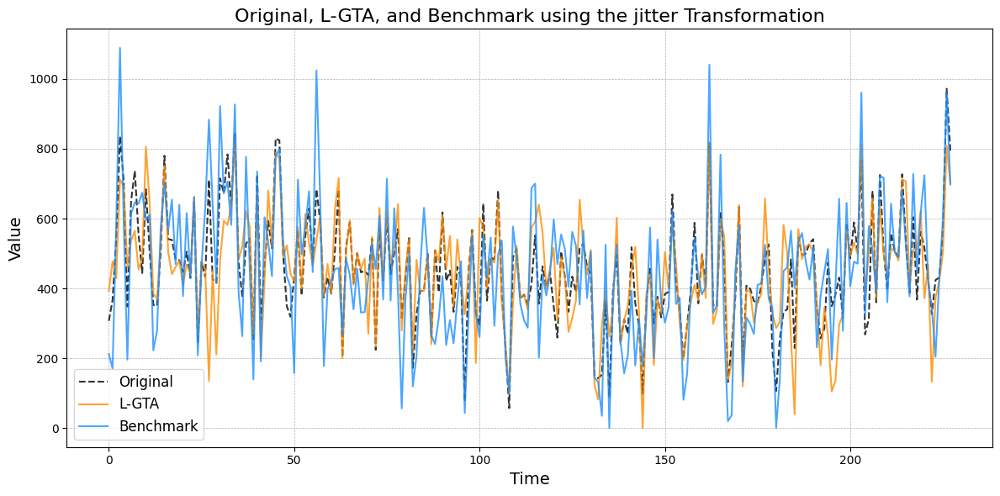

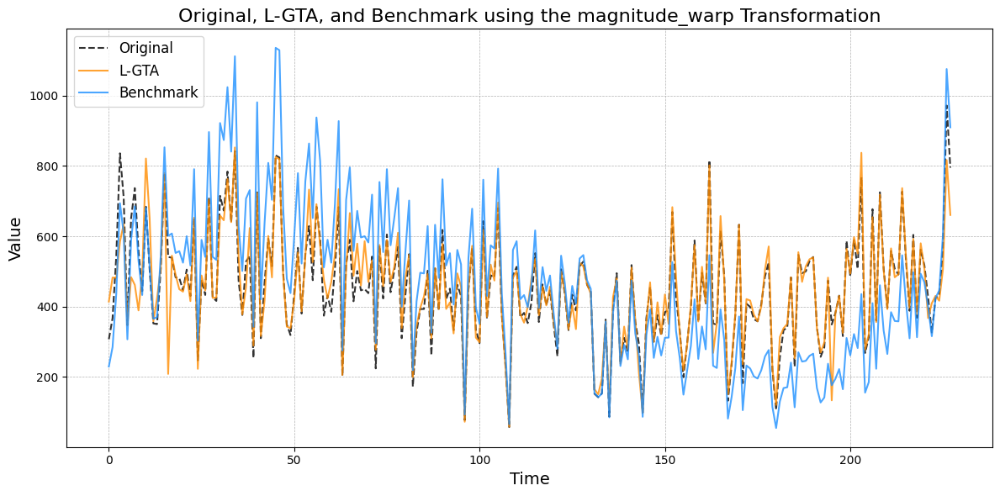

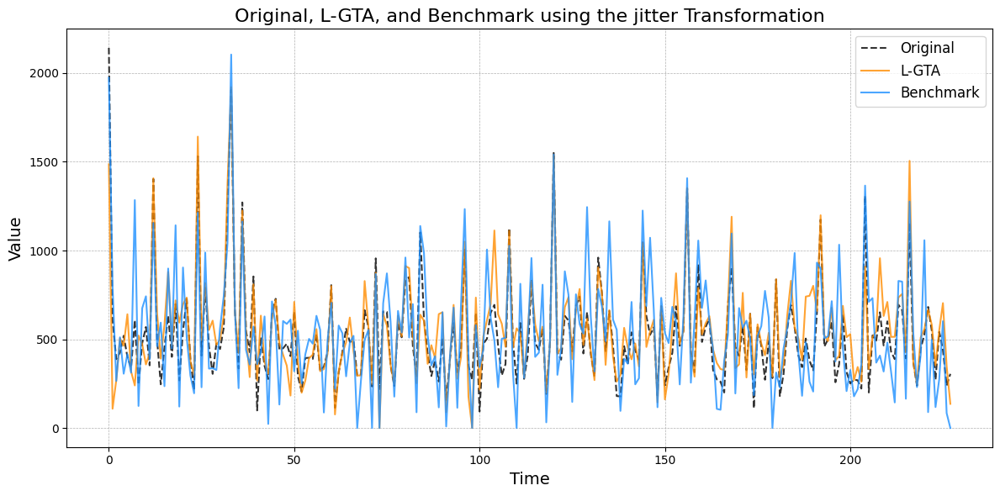

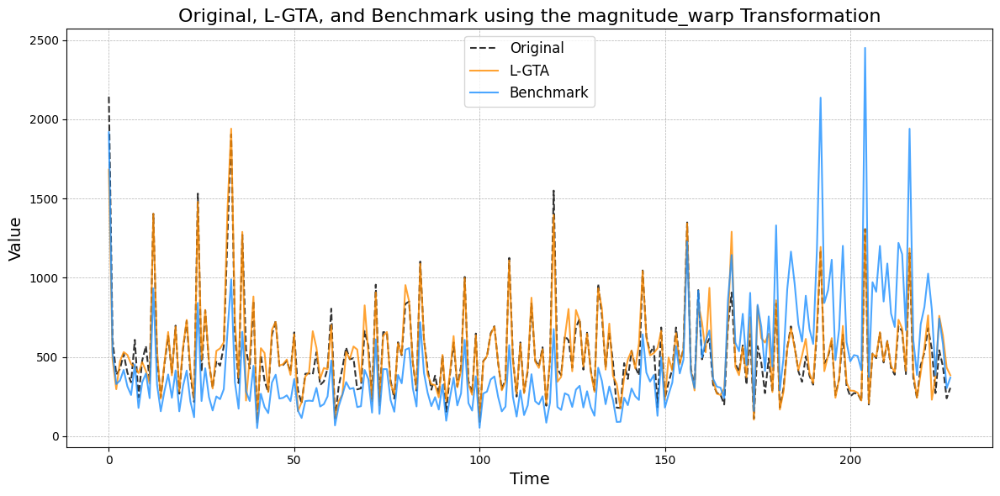

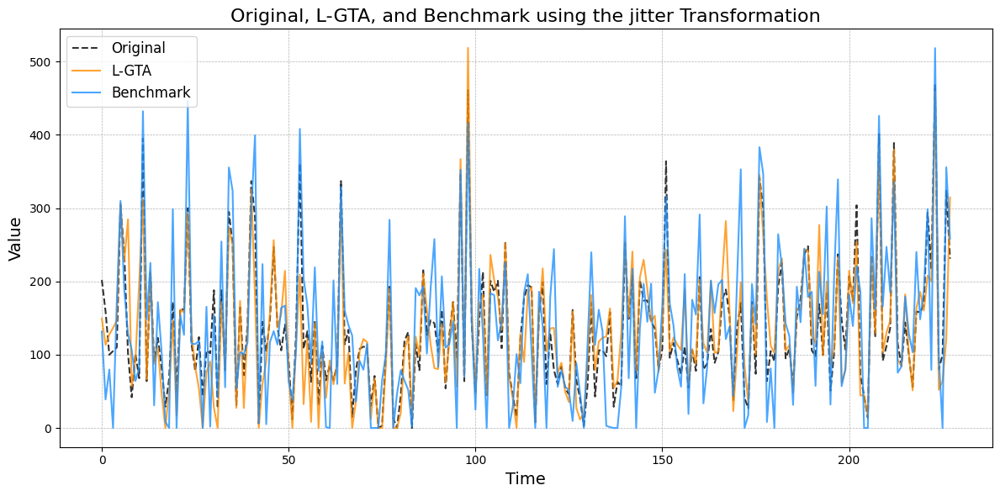

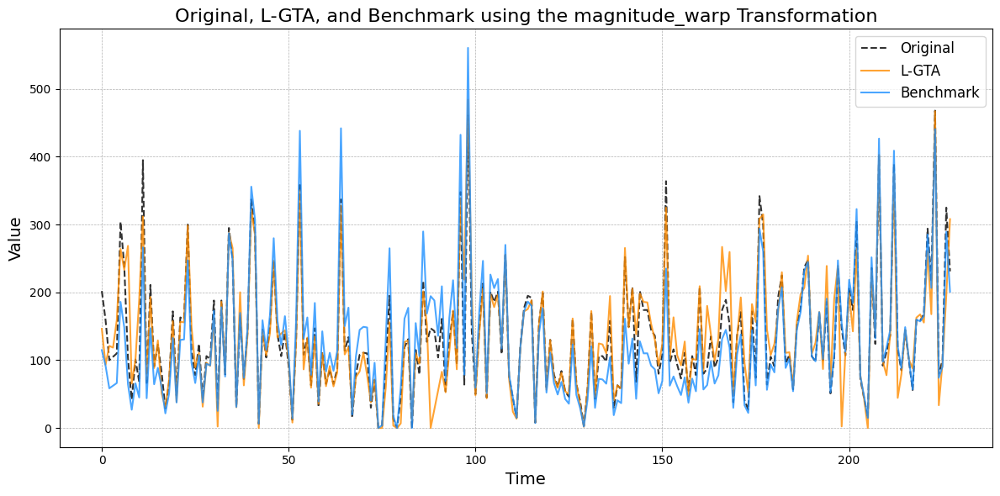

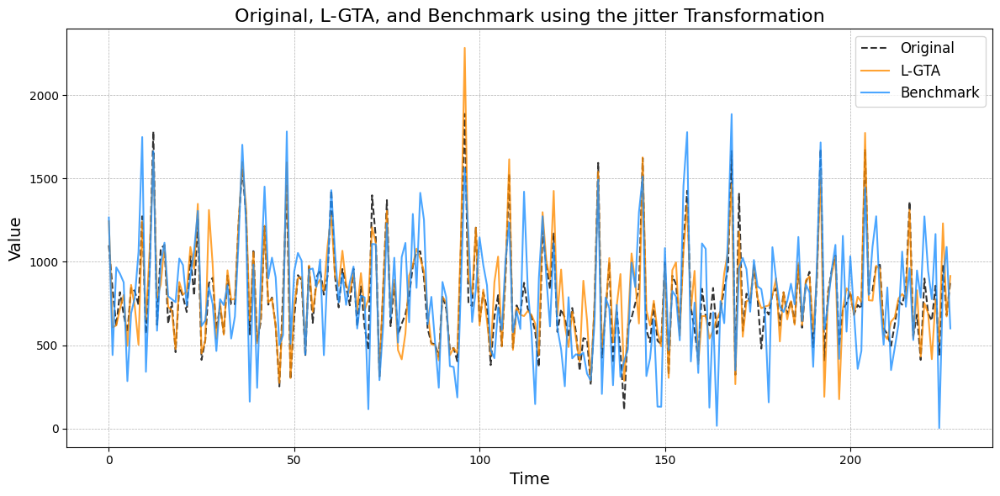

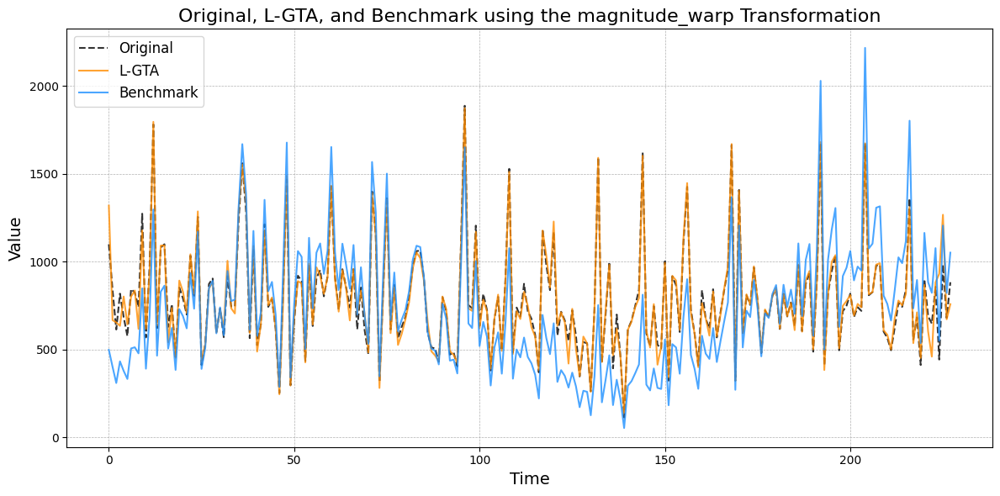

In [17]:
plot_single_time_series(
    dataset=dataset,
    freq=freq,
    generate_datasets=generate_datasets,
    X_orig=X_orig,
    model=model,
    z=z,
    create_dataset_vae=create_dataset_vae,
    transformations=transformations_plot,
    num_series=4,
)


Cell 8 – Magnitude comparison across methods
Text cell:

This cell calls compare_diff_magnitudes, which:

Applies transformations with different magnitudes

Compares L-GTA’s outputs vs. benchmark methods across these magnitudes

This lets you see how sensitive each method is to transformation strength and how they behave across a range.

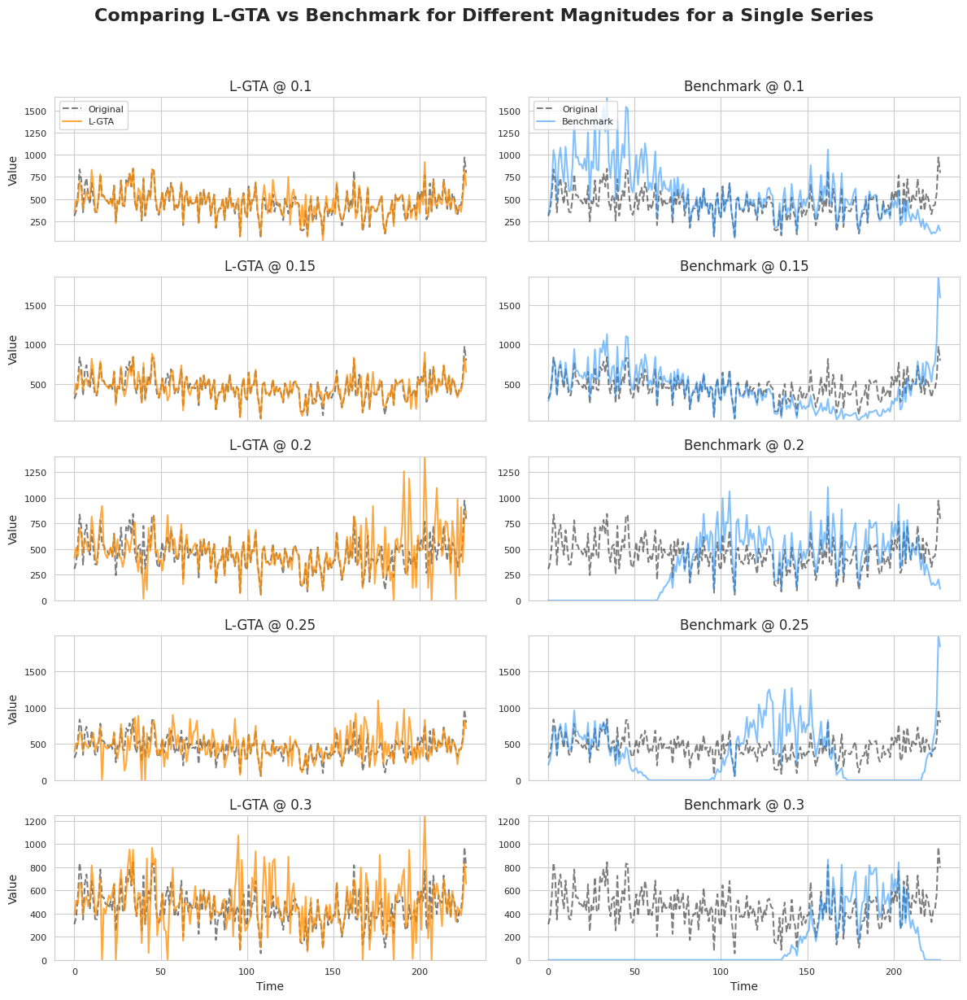

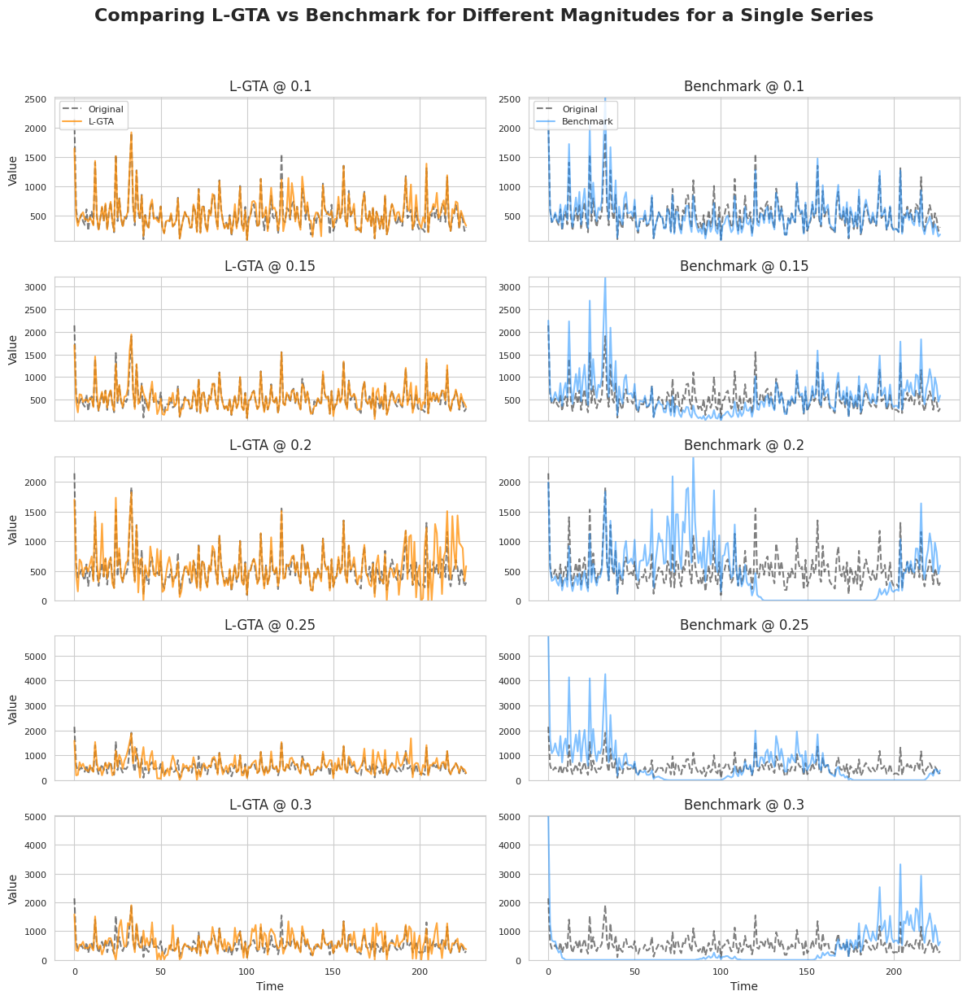

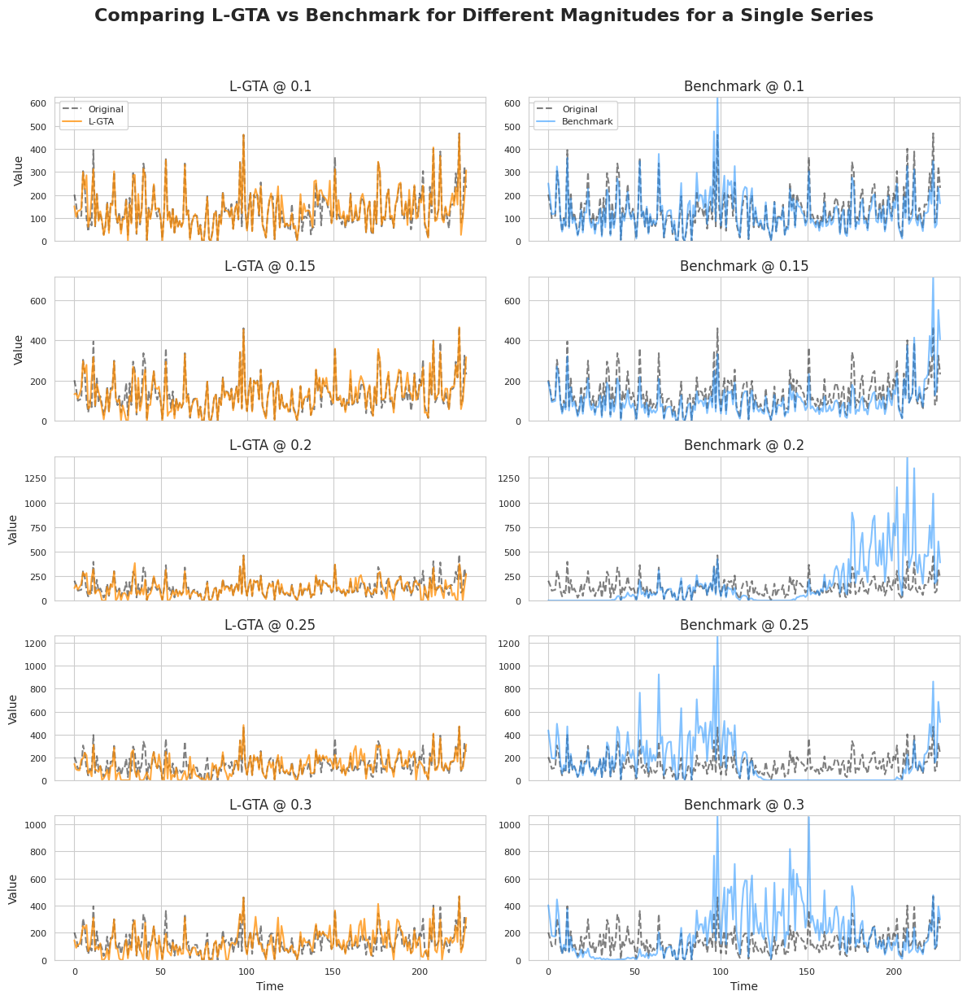

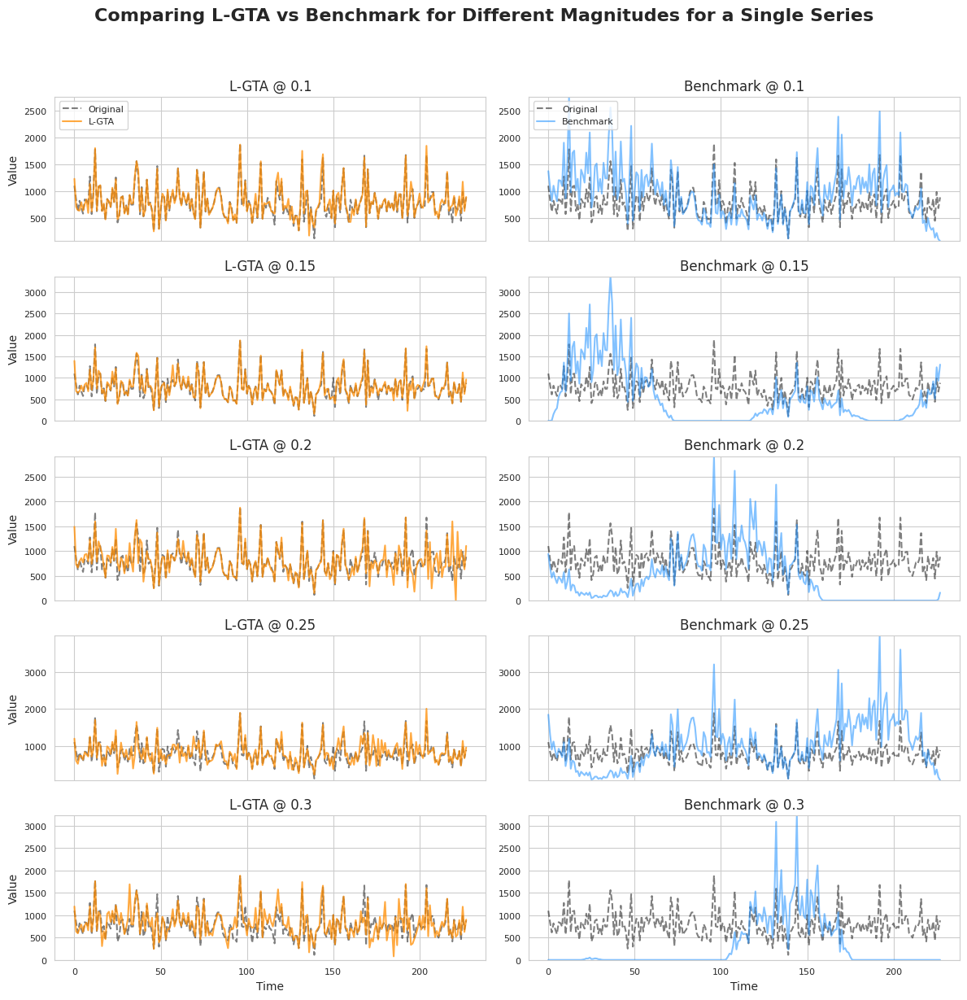

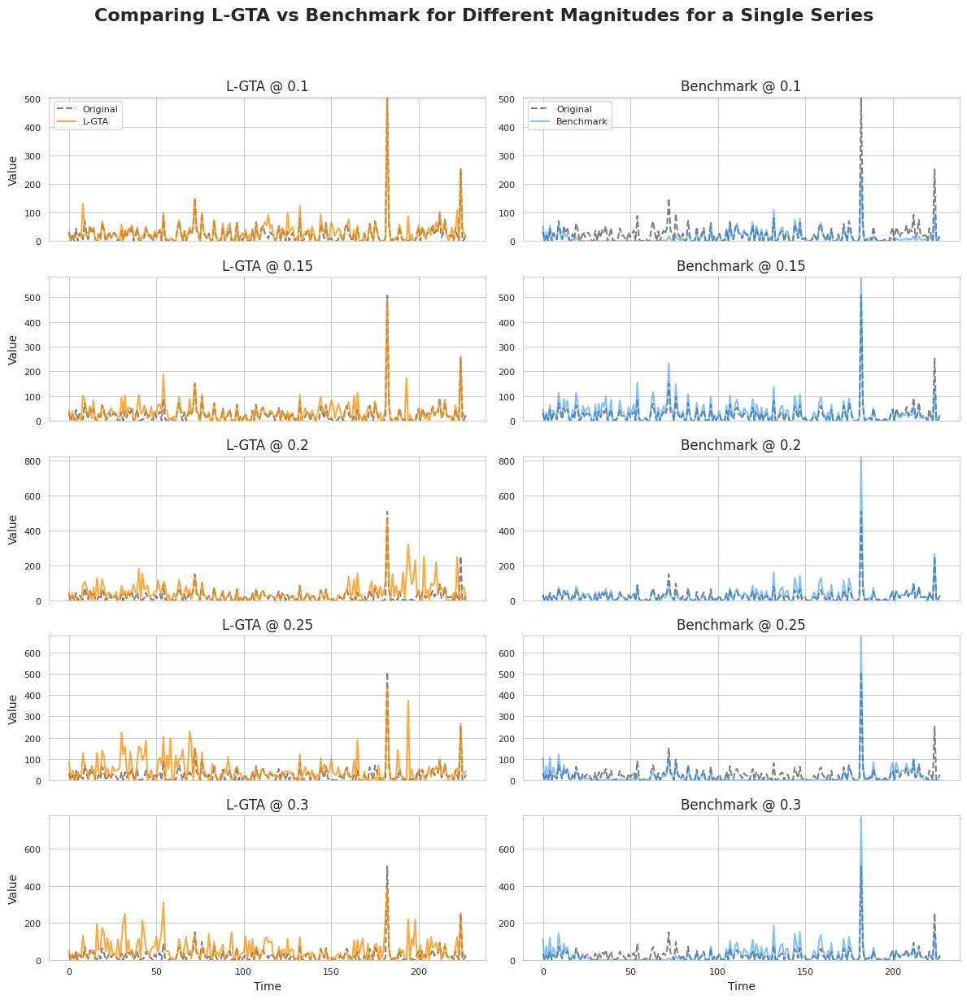

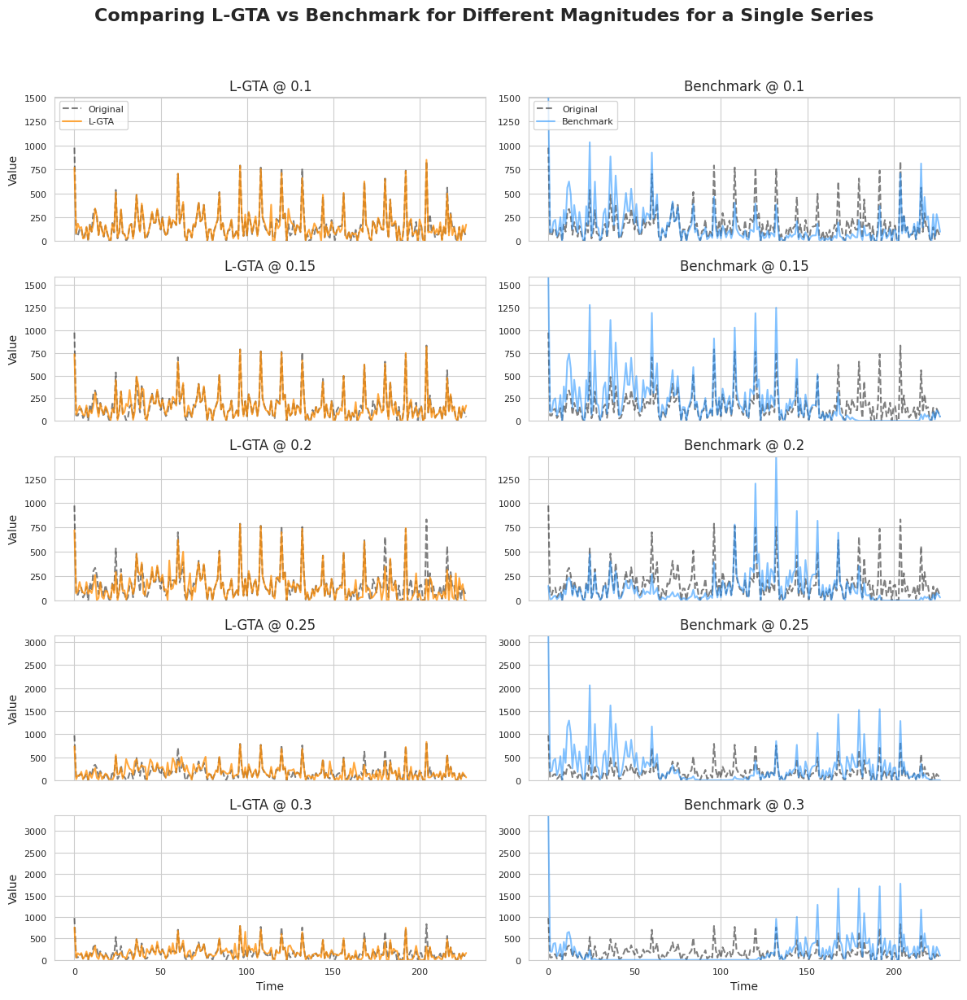

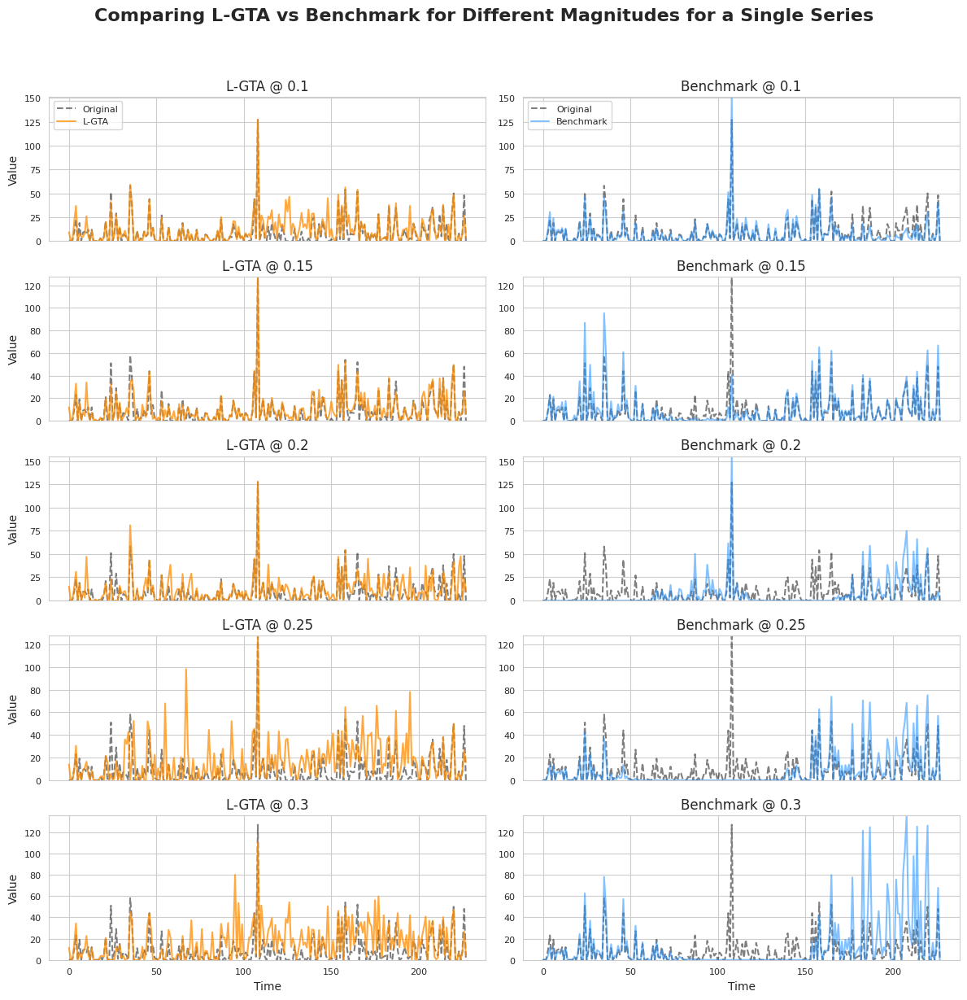

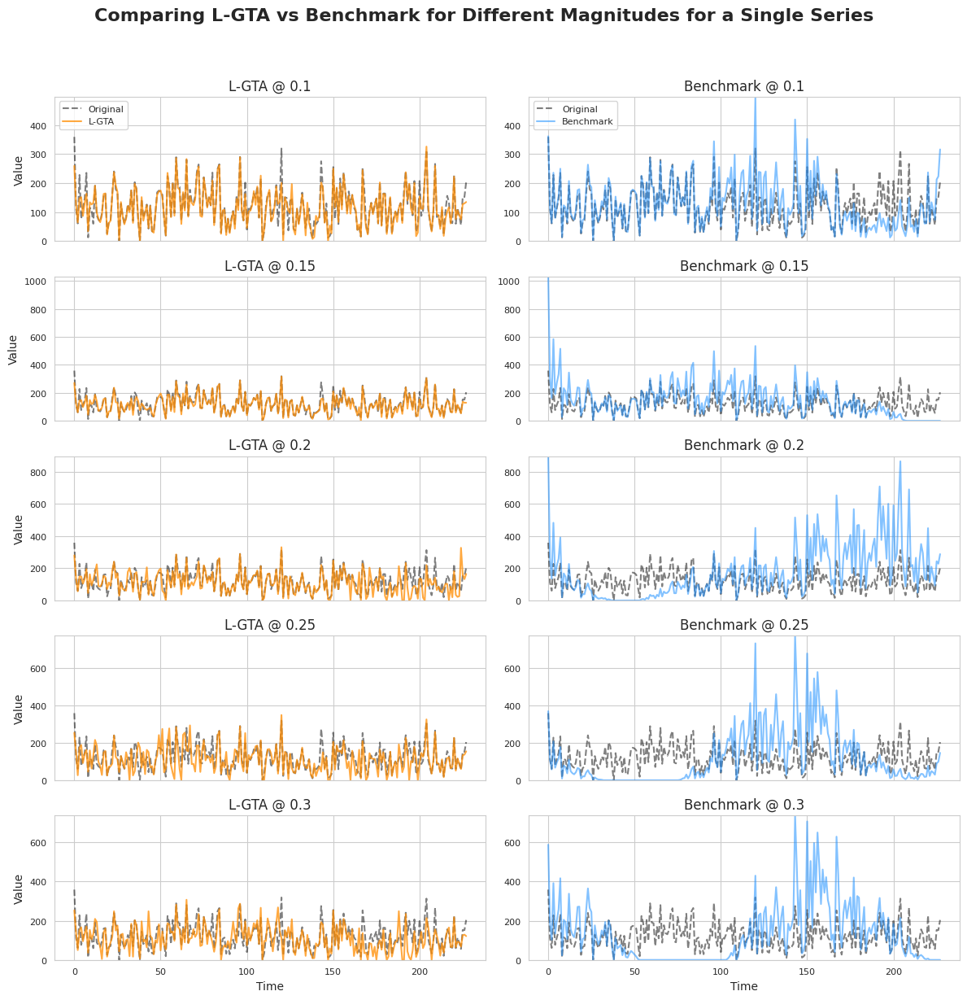

In [18]:
compare_diff_magnitudes(
    dataset,
    freq,
    model,
    z,
    create_dataset_vae,
    X_orig,
)


Cell 9 – Define transformations for full end-to-end (e2e) comparison
Text cell:

This cell sets up a list of transformations (jitter, scaling, magnitude_warp) for end-to-end comparison.

For each:

transformation: which type to test

params: transformation parameter(s) used by L-GTA

parameters_benchmark: baseline parameters for classical methods

version: internal implementation variant

These will be passed to e2e_transformation to perform full pipeline comparisons (including forecasting tasks, etc., depending on implementation).

In [19]:
transformations = [
    {
        "transformation": "jitter",
        "params": [0.5],
        "parameters_benchmark": {
            "jitter": 0.5,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 5,
    },
    {
        "transformation": "scaling",
        "params": [0.25],
        "parameters_benchmark": {
            "jitter": 0.375,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 4,
    },
    {
        "transformation": "magnitude_warp",
        "params": [0.1],
        "parameters_benchmark": {
            "jitter": 0.375,
            "scaling": 0.1,
            "magnitude_warp": 0.1,
            "time_warp": 0.05,
        },
        "version": 4,
    },
]


Cell 10 – Run end-to-end transformations and collect results
Text cell:

This cell loops over the transformations you just defined and, for each:

Calls e2e_transformation which:

Applies the L-GTA latent transformation

Applies the benchmark transformation

Runs the full evaluation pipeline (e.g., forecasting model performance, errors, etc.)

Stores all outputs in a dictionary results.

This builds the core comparison results for the paper-like experiments.

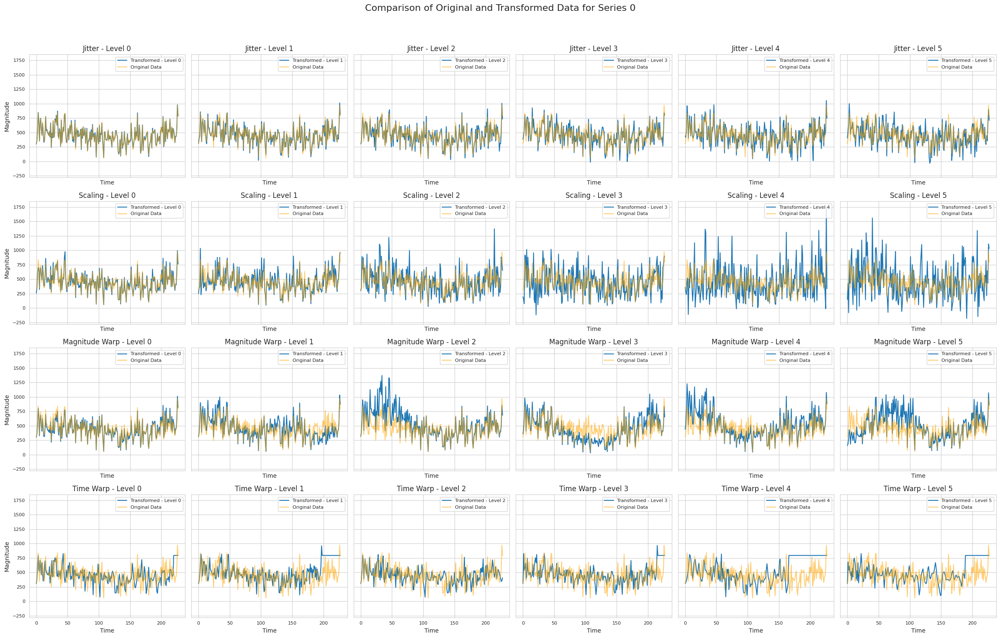

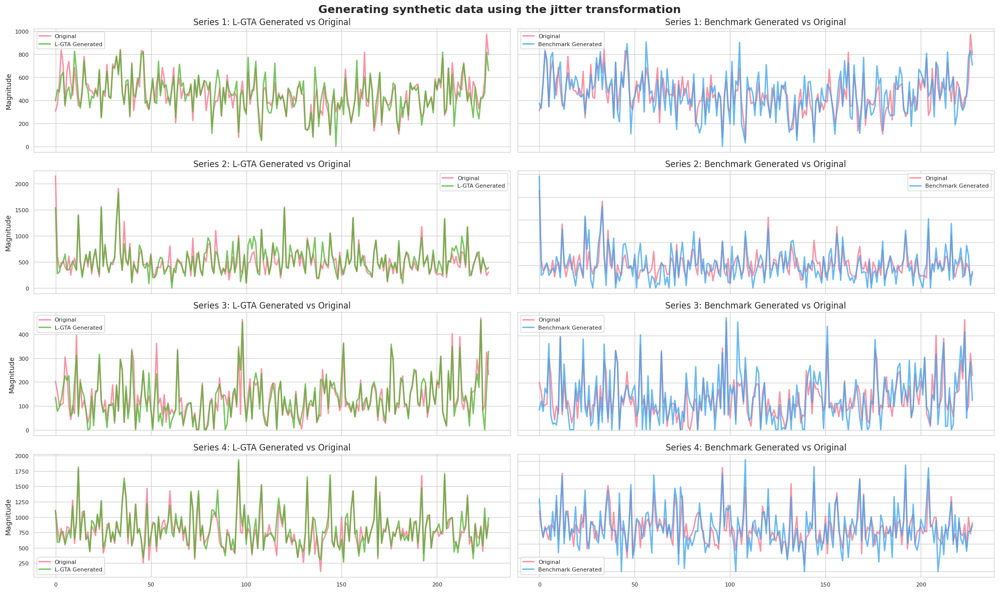

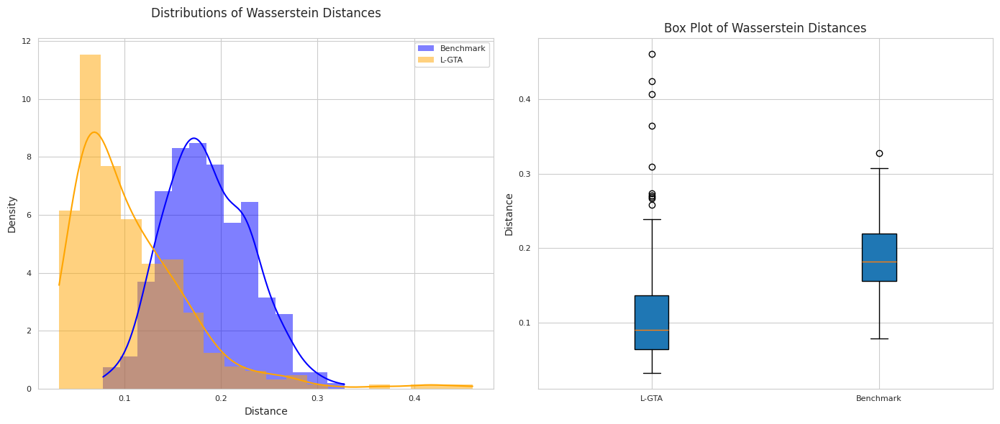

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


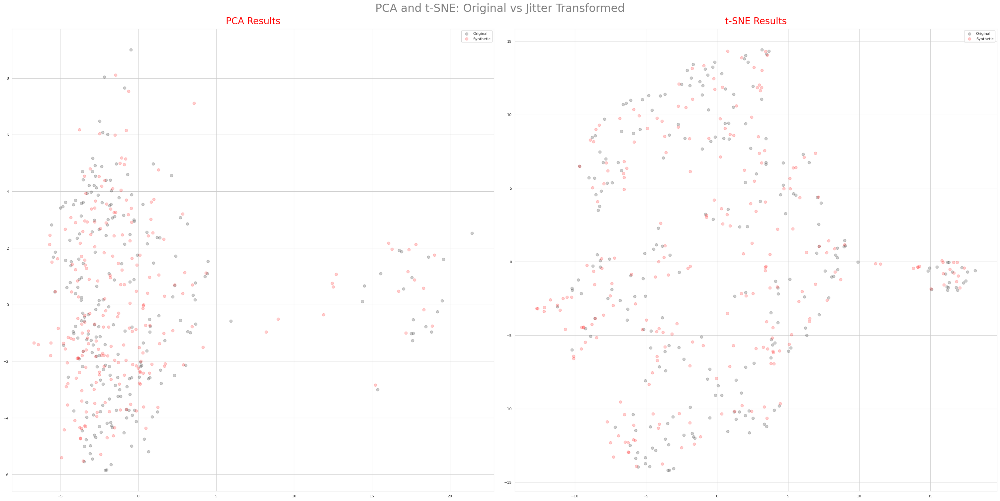

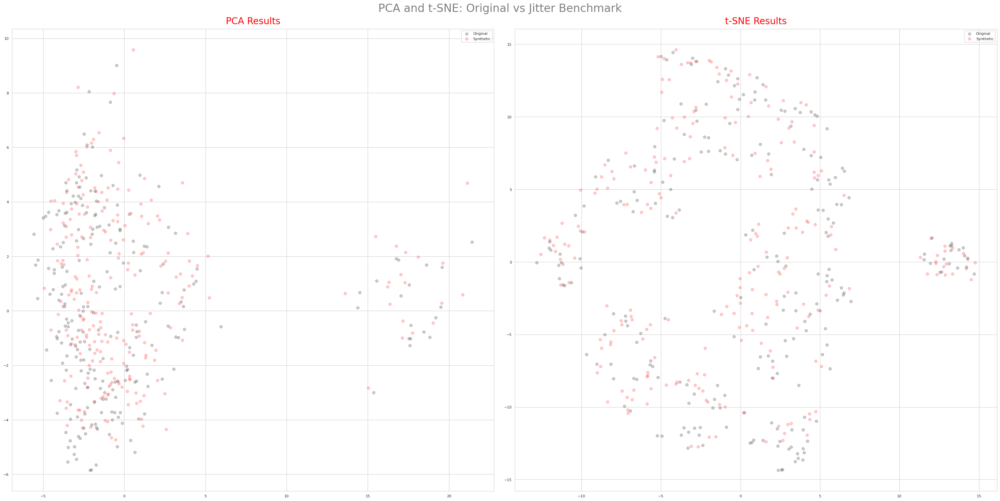

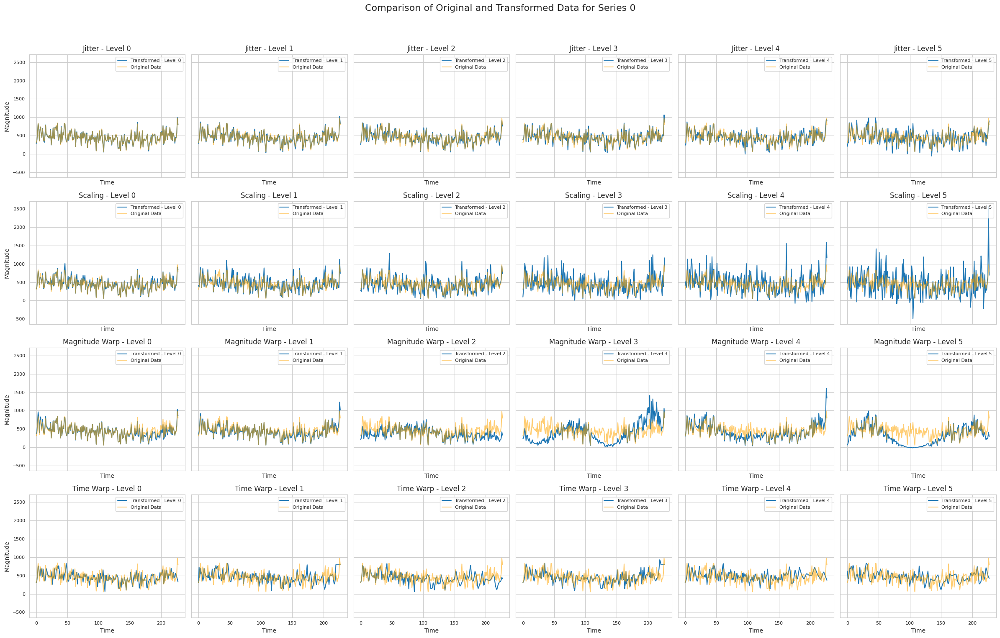

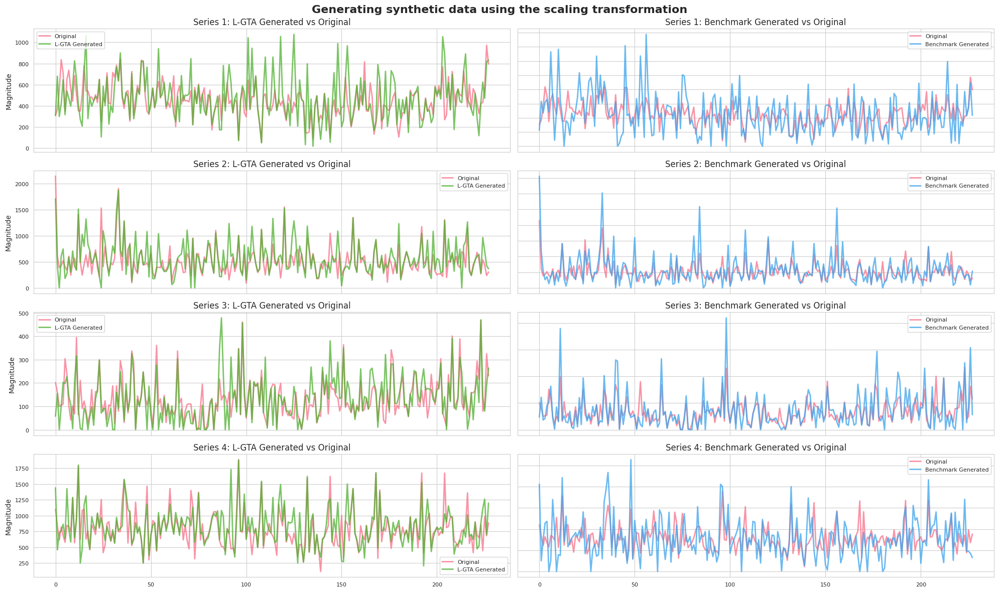

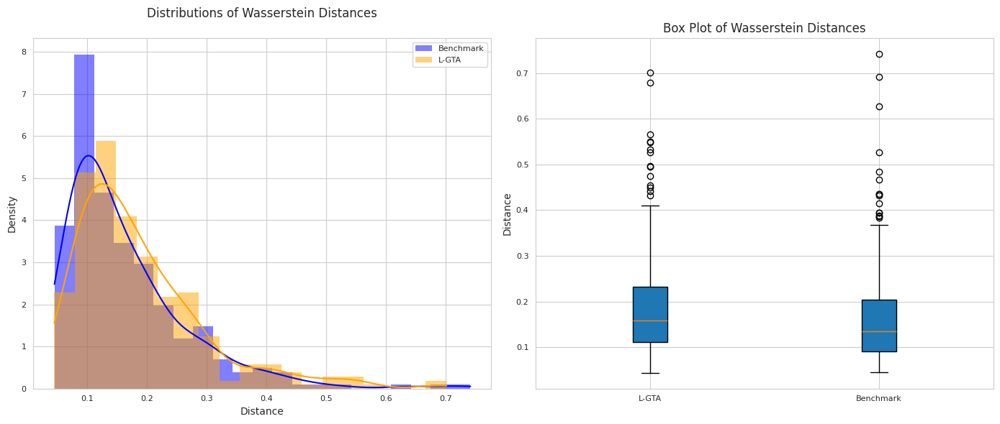

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


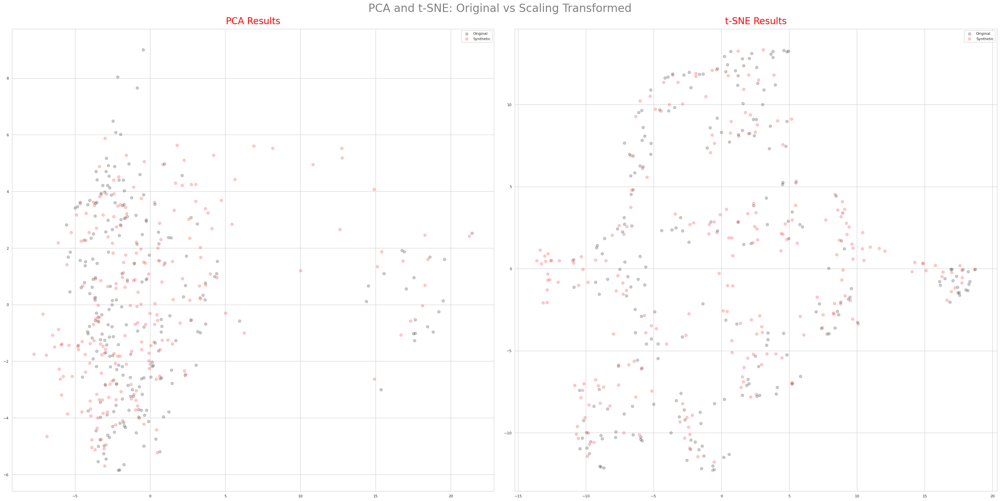

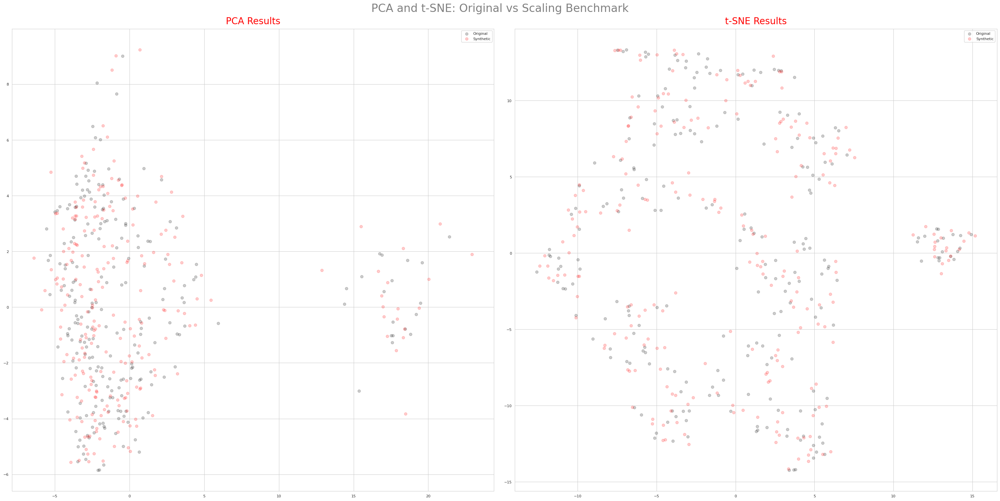

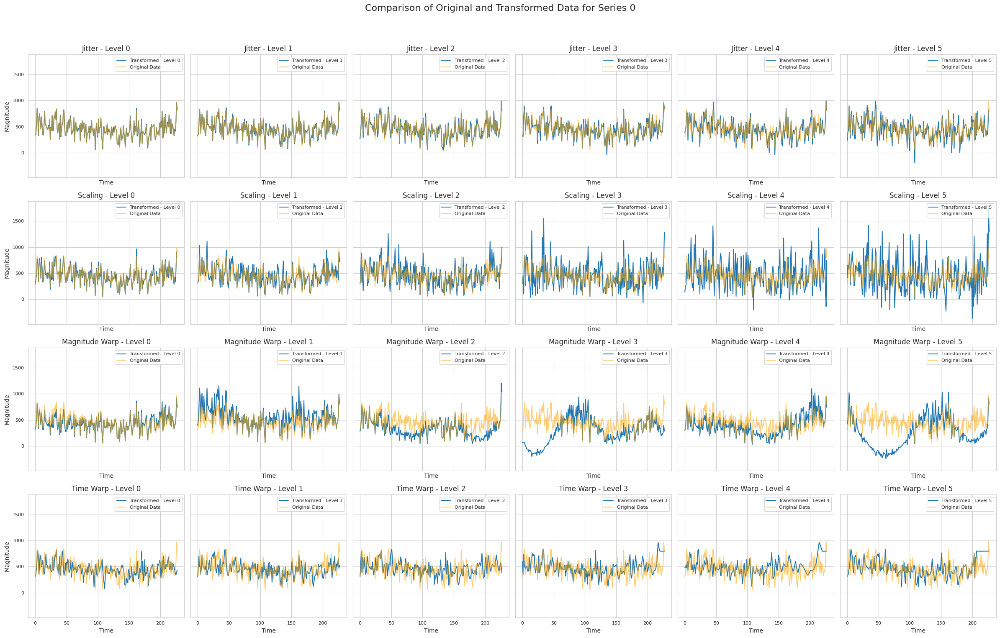

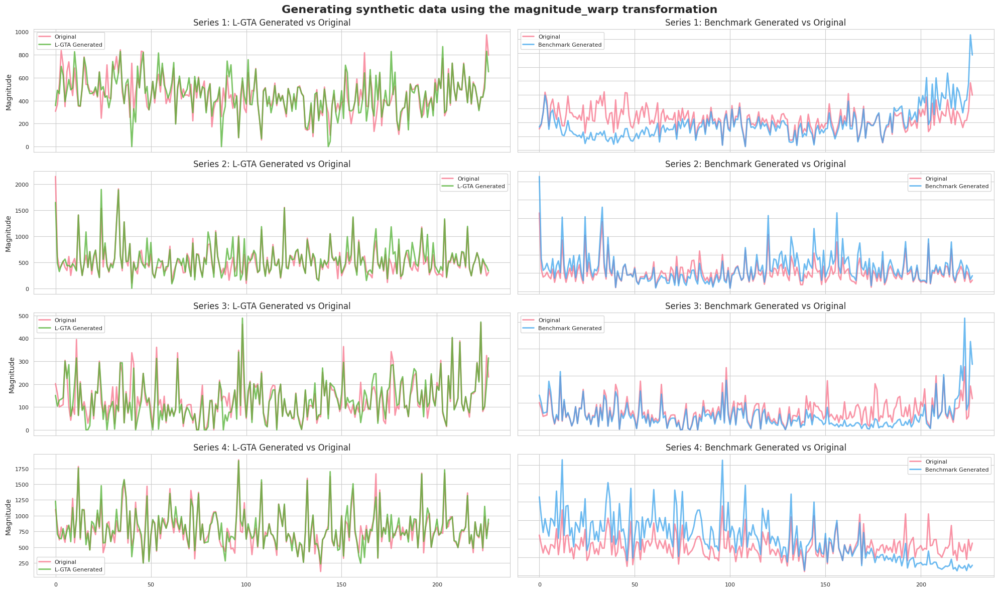

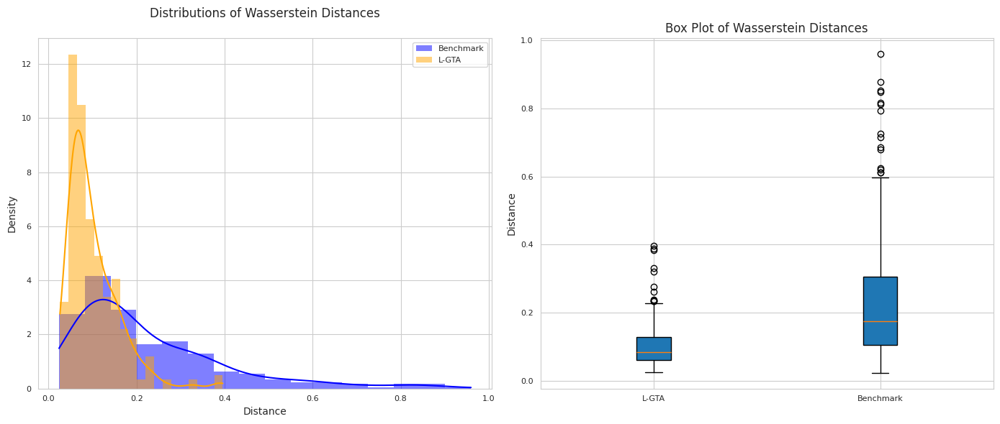

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


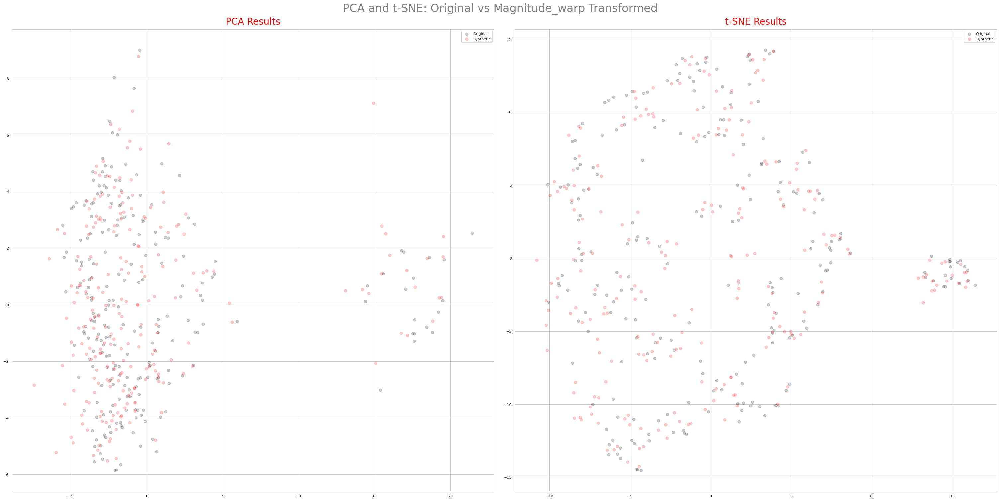

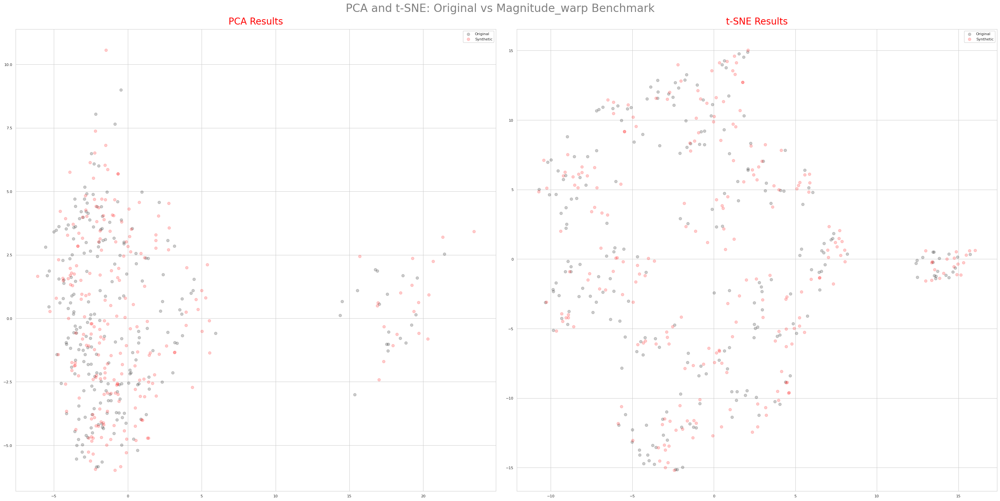

In [20]:
results = {}
for transformation in transformations:
    results[transformation["transformation"]] = e2e_transformation(
        dataset,
        freq,
        model,
        z,
        create_dataset_vae,
        transformation["transformation"],
        transformation["params"],
        transformation["parameters_benchmark"],
        transformation["version"],
        X_orig,
        X_hat,
    )


Cell 11 – Process and store comparison metrics
Text cell:

This cell:

Calls process_transformations(results) to:

Normalize, structure, and aggregate results from the e2e experiments.

Generates datasets/tables for:

Distance metrics between original and transformed data (create_distance_metrics_dataset)

Reconstruction error percentages (create_reconstruction_error_percentage_dataset)

Prediction performance comparisons (create_prediction_comparison_dataset)

These outputs are useful for tables and plots in your IEEE-style paper.

In [21]:
res_processed = process_transformations(results)

create_distance_metrics_dataset(res_processed)
create_reconstruction_error_percentage_dataset(res_processed)
create_prediction_comparison_dataset(res_processed)


Transformation,jitter,magnitude_warp,scaling
Model,,,
Original,0.023,0.022,0.022
L-GTA,0.023,0.023,0.023
Benchmark,0.022,0.024,0.025


Cell 12 – Residuals analysis: single transformation and magnitude
Text cell:

This cell focuses on detailed residuals analysis for one transformation (here: "jitter").

Steps:

Generate datasets:

X_orig: original

X_lgta: L-GTA transformed

X_benchmark: classical transformed

Standardize them and compute residuals:

residuals_lgta, residuals_benchmark

Plot series comparisons:

Visual comparison of original vs. both methods

Analyze transformations statistically using analyze_transformations.

This helps understand where and how L-GTA differs from direct augmentation.

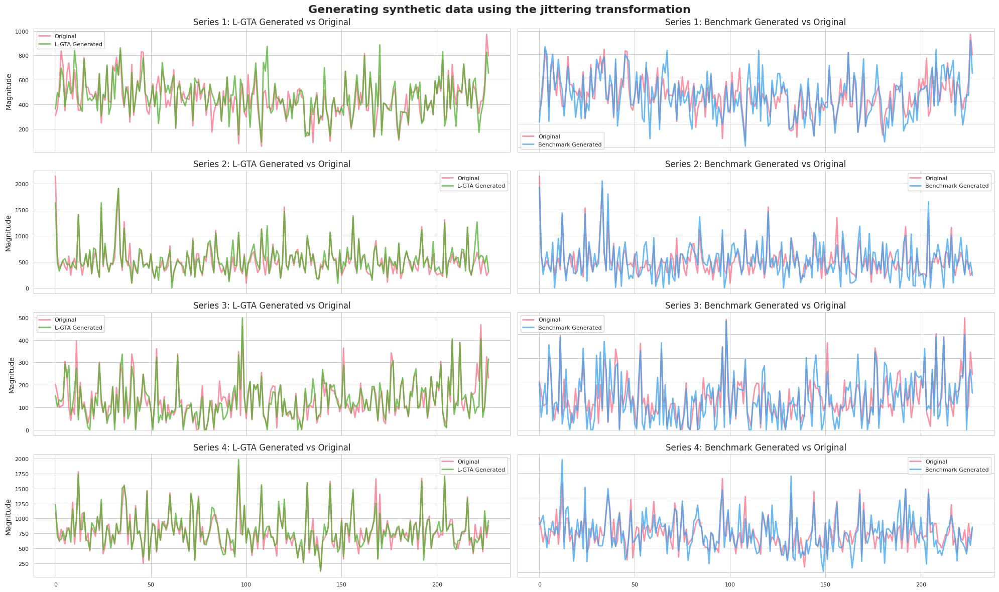

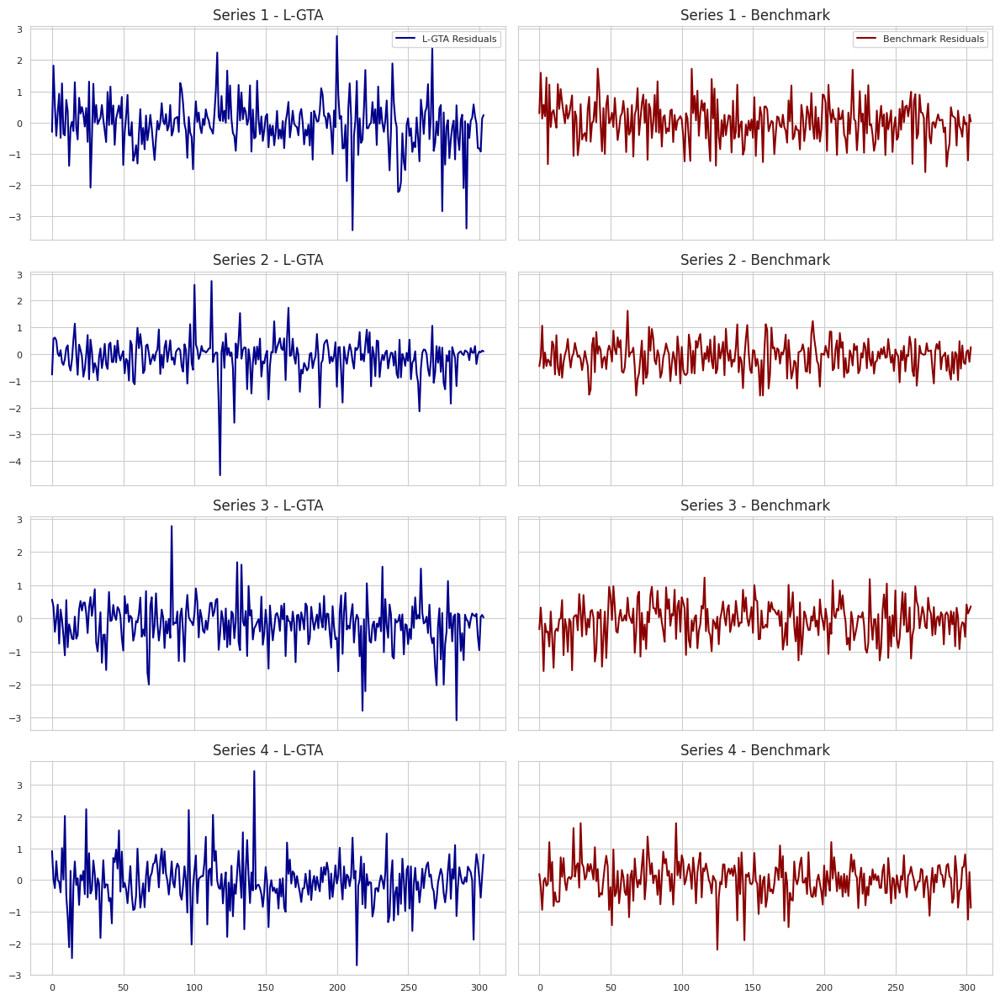

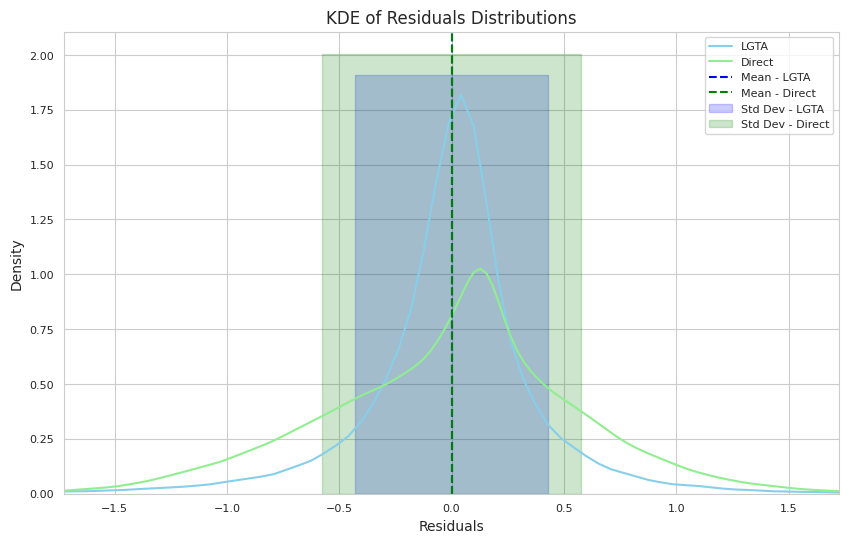

In [22]:
transformation = "jitter"
params = [0.5]

parameters_benchmark = {
    "jitter": 0.5,
    "scaling": 0.1,
    "magnitude_warp": 0.1,
    "time_warp": 0.05,
}

version = 5

X_orig, X_lgta, X_benchmark = generate_datasets(
    dataset,
    freq,
    model,
    z,
    create_dataset_vae,
    X_orig,
    transformation,
    params,
    parameters_benchmark,
    version,
)
residuals_lgta, residuals_benchmark = standardize_and_calculate_residuals(
    X_orig, X_lgta, X_benchmark
)
plot_series_comparisons(X_orig, X_lgta, X_benchmark, "jittering")
analyze_transformations(residuals_lgta, residuals_benchmark)


Cell 13 – Residuals across multiple magnitudes
Text cell:

This final block:

Studies how residuals change as you increase transformation strength.

Uses jittering with several magnitudes: [0.5, 0.6, 0.7, 0.8, 0.9].

For each magnitude:

Generates original, L-GTA transformed, and benchmark transformed data

Computes residuals

Accumulates residuals across magnitudes into lists:

residuals_lgta_all, residuals_benchmark_all

Uses plot_residuals_gradient to visualize how residuals evolve with magnitude for both methods.

This gives a gradient-style view of how robust or stable each method is as transformations get stronger.

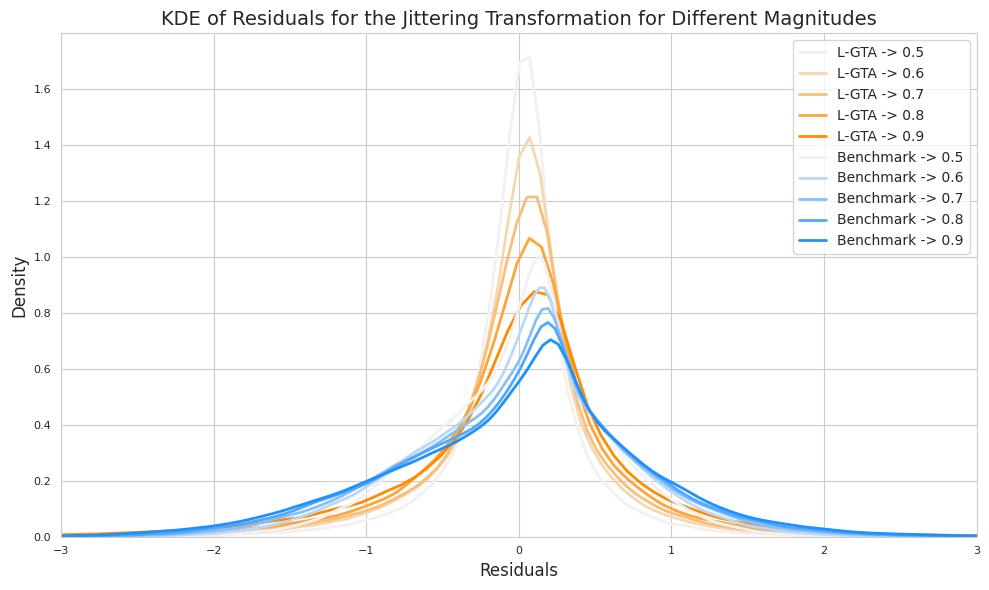

In [23]:
transformation = "jitter"
params = [0.5, 0.6, 0.7, 0.8, 0.9]

parameters_benchmark = [
    {
        "jitter": 0.5,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
    {
        "jitter": 0.6,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
    {
        "jitter": 0.7,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
    {
        "jitter": 0.8,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
    {
        "jitter": 0.9,
        "scaling": 0.1,
        "magnitude_warp": 0.1,
        "time_warp": 0.05,
    },
]

version = 5

residuals_lgta_all = []
residuals_benchmark_all = []

for i, param in enumerate(params):
    X_orig, X_lgta, X_benchmark = generate_datasets(
        dataset,
        freq,
        model,
        z,
        create_dataset_vae,
        X_orig,
        transformation,
        [param],
        parameters_benchmark[i],
        version,
    )
    residuals_lgta, residuals_benchmark = standardize_and_calculate_residuals(
        X_orig, X_lgta, X_benchmark
    )
    residuals_lgta_all.append(residuals_lgta)
    residuals_benchmark_all.append(residuals_benchmark)

plot_residuals_gradient(residuals_lgta_all, residuals_benchmark_all, params)
